## Differencene plots for output with Smax. 

### Div imports:

In [19]:
# load and autoreload
from IPython import get_ipython

from sect_sens.data_info.simulation_types import get_diff_by_type
from sect_sens.util.imports import get_averaged_fields

from sect_sens.constants import get_plotpath
from sect_sens.util.practical_functions import make_folders
from matplotlib import colors
from sect_sens.data_info.simulation_types import get_abs_by_type

from sect_sens.data_info.simulation_types import get_casen_by_type_mod

from sect_sens.util.slice_average.significance import load_and_plot_sign
import cartopy.crs as ccrs

from sect_sens.util.plot.maps_PIPD import abs_diffs_PI_PD_sep, diffs_PI_PD_sep

from scipy.stats import lognorm
import matplotlib.pyplot as plt
import xarray as xr 
import numpy as np

from IPython.display import clear_output

# noinspection PyBroadException,DuplicatedCode
try:
    _ipython = get_ipython()
    _magic = _ipython.magic
    _magic('load_ext autoreload')
    _magic('autoreload 2')
except:
    pass

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### Div settings: 

In [20]:
p_level = 1013.
pmin = 850.  # minimum pressure level
avg_over_lev = True  # True#True#False#True
pressure_adjust = True  # Can only be false if avg_over_lev false. Plots particular hybrid sigma lev
p_levels = [1013., 900., 800., 700., 600.]  # used if not avg

In [21]:
model = 'NorESM'

startyear = '0004-01'
endyear = '0005-12'

In [22]:
cases_sec = [
    'NF1850_SECT_ctrl_smax',
    'NF1850_aeroxid2014_SECT_ctrl_smax'
]
cases_orig = [
    'NF1850_noSECT_def_smax',
    'NF1850_aeroxid2014_noSECT_def_smax',
]

cases = cases_orig + cases_sec

### For output names:

In [23]:
version = 'pi_pd_diff_smax'
plot_path = get_plotpath('maps')
filen_base = plot_path + '/%s' % version
# print(plot_path)
make_folders(plot_path)

### Variables to load:

In [24]:
varl = ['NCONC01', 'NMR01', 'N_AER', 'ACTNL_incld', 'ACTREL_incld', 'CDNUMC', 'cb_NA',
        'cb_SOA_NA', 'cb_SO4_NA', 'AWNC_incld', 'AREL_incld', 'NACT01', 'NACT02', 'NACT04',
        'NACT06', 'NACT08', 'NACT14', 'Smax_w', 'Smax', 'SIGMA01', 'NMR01', 'NCONC04',
        'NCONC06', 'NCONC08', 'NCONC14', 'NACT_FRAC01', 'NACT_FRAC04', 'NACT_FRAC06',
        'NACT_FRAC08', 'NACT_FRAC14', 'SWCF_Ghan', 'LWCF_Ghan', 'NCFT_Ghan', 'NCONC01']
subfig_size = 2.9
asp_ratio = .9
print(varl)

['NCONC01', 'NMR01', 'N_AER', 'ACTNL_incld', 'ACTREL_incld', 'CDNUMC', 'cb_NA', 'cb_SOA_NA', 'cb_SO4_NA', 'AWNC_incld', 'AREL_incld', 'NACT01', 'NACT02', 'NACT04', 'NACT06', 'NACT08', 'NACT14', 'Smax_w', 'Smax', 'SIGMA01', 'NMR01', 'NCONC04', 'NCONC06', 'NCONC08', 'NCONC14', 'NACT_FRAC01', 'NACT_FRAC04', 'NACT_FRAC06', 'NACT_FRAC08', 'NACT_FRAC14', 'SWCF_Ghan', 'LWCF_Ghan', 'NCFT_Ghan', 'NCONC01']


## Load data from file: 
The following algortithm computes and loades map averages. 

In [7]:
case_dic = get_averaged_fields.get_maps_cases(cases,
                                              varl,
                                              startyear,
                                              endyear,
                                              avg_over_lev=avg_over_lev,
                                              pmin=pmin,
                                              pressure_adjust=pressure_adjust,
                                              p_level=p_level,
                                              )

Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECT_SENS//means/map_means//NorESM/NF1850_noSECT_def_smax/NCONC01_0004-01-0005-12_avg2lev850.nc


/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/xarray/coding/times.py:426: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  dtype = _decode_cf_datetime_dtype(data, units, calendar, self.use_cftime)
/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/numpy/core/_asarray.py:85: SerializationWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using cftime.datetime objects instead, reason: dates out of range
  return array(a, dtype, copy=False, order=order)


Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECT_SENS//means/map_means//NorESM/NF1850_noSECT_def_smax/NMR01_0004-01-0005-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECT_SENS//means/map_means//NorESM/NF1850_noSECT_def_smax/N_AER_0004-01-0005-12_avg2lev850.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECT_SENS//means/map_means//NorESM/NF1850_noSECT_def_smax/ACTNL_incld_0004-01-0005-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECT_SENS//means/map_means//NorESM/NF1850_noSECT_def_smax/ACTREL_incld_0004-01-0005-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECT_SENS//means/map_means//NorESM/NF1850_noSECT_def_smax/CDNUMC_0004-01-0005-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECT_SENS//means/map_means//NorESM/NF1850_noSECT_def_smax/cb_NA_0004-01-0005-12_lev_not_dim.nc
Loading file /home/ubuntu/mnts/nird/projects//Output_data_SECT_SENS//m

## Calculate various variables:

In [8]:
for case in cases:
    _ds = case_dic[case]
    # Fraction of particles from NPF
    _ds['NPF_frac'] = _ds['NCONC01'] / _ds['N_AER'] * 100
    _ds['NPF_frac'].attrs['units'] = '%'
    _ds['NPF_frac'].attrs['long_name'] = 'frac of particles from NPF'
    
    # noinspection DuplicatedCode
    _ds['NACT1_4'] = _ds['NACT01'] + _ds['NACT04']
    _ds['NACT1,4,6,8,14'] = _ds['NACT01'] + _ds['NACT04'] + _ds['NACT06'] + _ds['NACT08'] + _ds['NACT14']
    if _ds['Smax_w'].attrs['units'] != '%':
        _ds['Smax_w'] = _ds['Smax_w'] * 100.
        _ds['Smax_w'].attrs['units'] = '%'
        _ds['Smax_w'].attrs['long_name'] = 'S$_{max}$'
if 'NPF_frac' not in varl:
    varl.append('NPF_frac')

### Get difference from PI to PD

In [9]:
relative = False
dic_diff = get_diff_by_type(case_dic, varl, ctrl='PI_smx', case_types=['PI_smx', 'PD_smx'],
                            mod_types=['OsloAeroSec', 'OsloAero$_{def}$'],
                            relative=relative)

dic_diff.keys()
di_dic = dic_diff['PD_smx-PI_smx']
di_dic.keys()

['PI_smx', 'PD_smx'] ['OsloAeroSec', 'OsloAero$_{def}$']
subtracting NF1850_SECT_ctrl_smax-NF1850_SECT_ctrl_smax
subtracting NF1850_noSECT_def_smax-NF1850_noSECT_def_smax
subtracting NF1850_aeroxid2014_SECT_ctrl_smax-NF1850_SECT_ctrl_smax
subtracting NF1850_aeroxid2014_noSECT_def_smax-NF1850_noSECT_def_smax


dict_keys(['OsloAeroSec', 'OsloAero$_{def}$'])

### Organize data in easy to use format:

In [10]:

dic_abs = get_abs_by_type(case_dic,
                          case_types=['PI_smx', 'PD_smx'],
                          mod_types=['OsloAeroSec', 'OsloAero$_{def}$'],
                          )

['PI_smx', 'PD_smx'] ['OsloAeroSec', 'OsloAero$_{def}$']


In [11]:
dic_abs.keys()

dict_keys(['PI_smx', 'PD_smx'])

In [12]:
dic_abs['PI_smx'].keys()

dict_keys(['OsloAeroSec', 'OsloAero$_{def}$'])

## Set which case should act as ctr: 

In [13]:
ctrl = 'OsloAeroSec'

cases_oth = ['OsloAero$_{def}$']

## Plots:

/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/matplotlib/colors.py:1171: RuntimeWarning: invalid value encountered in less_equal
  mask |= resdat <= 0


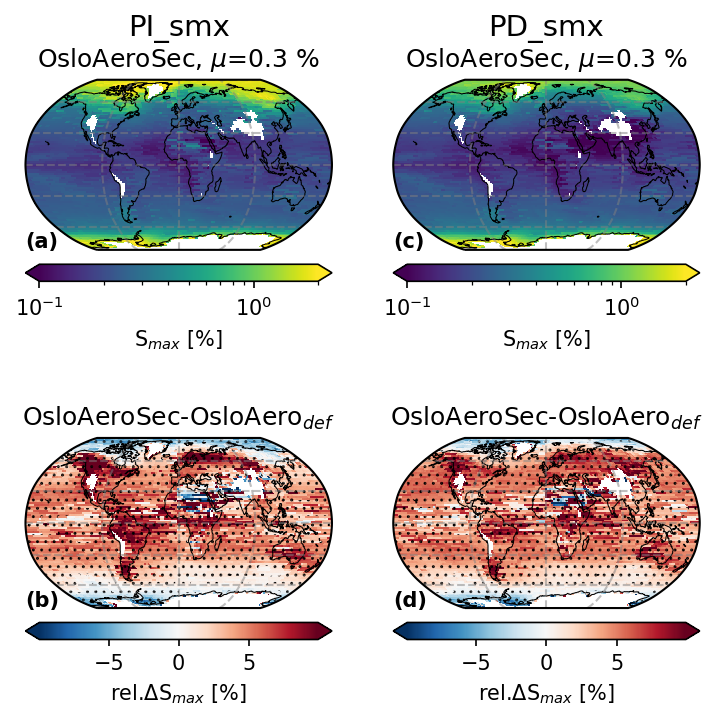

In [14]:
var = 'Smax_w'
relative = True
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   norm_abs=colors.LogNorm(vmin=.1, vmax=2),
                                   case_types=['PI_smx', 'PD_smx'],
                                   cases_oth=cases_oth,
                                   type_nndic={'PI_smx': 'Pre-industrial', 'PD_smx': 'Present day'},
                                   switch_diff=True,
                                   )

for ct in ['PI_smx', 'PD_smx']:
    ax_di = axs_dic[ct]
    for case_oth in cases_oth:
        ax = ax_di[case_oth]
        cs_to = get_casen_by_type_mod(ct, ctrl)
        cs_from = get_casen_by_type_mod(ct, case_oth)

        load_and_plot_sign(cs_to, [cs_from], [ax], var, startyear, endyear, pressure_adjust=pressure_adjust,
                           avg_over_lev=avg_over_lev,
                           ci=.95,
                           groupby=None,
                           dims=('lev',),
                           area='Global',
                           avg_dim='time',

                           hatches=['...', ''],
                           hatch_lw=.6,

                           transform=ccrs.PlateCarree(),
                           reverse=False)
clear_output()

fn = filen_base + f'{var}_PIPD_sep_rel{relative}_pmin{str(int(pmin))}.pdf'
fig.savefig(fn, dpi=300)

plt.show()

In [15]:
print(fn)

/home/ubuntu/mnts/nird/projects//Plots_SECT_SENS/maps//pi_pd_diff_smaxSmax_w_PIPD_sep_relTrue_pmin850.pdf


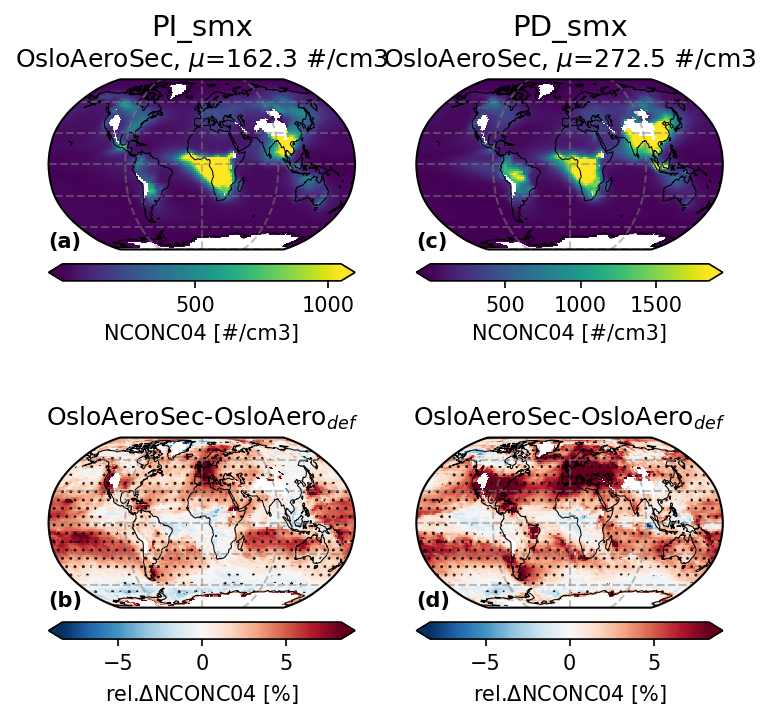

In [44]:
var = 'NCONC04'
relative = True
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   case_types=['PI_smx', 'PD_smx'],
                                   # mod_types=['OsloAeroSec','OsloAero$_{def}$'],
                                   cases_oth=['OsloAero$_{def}$'],
                                   type_nndic={'PI_smx': 'Pre-industrial', 'PD_smx': 'Present day'},
                                   switch_diff=True
                                   )
for ct in ['PI_smx', 'PD_smx']:
    ax_di = axs_dic[ct]
    for case_oth in cases_oth:
        ax = ax_di[case_oth]
        cs_to = get_casen_by_type_mod(ct, ctrl)
        cs_from = get_casen_by_type_mod(ct, case_oth)

        load_and_plot_sign(cs_to, [cs_from], [ax], var, startyear, endyear, pressure_adjust=pressure_adjust,
                           avg_over_lev=avg_over_lev,
                           ci=.95,
                           groupby=None,
                           dims=('lev',),
                           area='Global',
                           avg_dim='time',

                           hatches=['...', ''],
                           hatch_lw=.6,

                           transform=ccrs.PlateCarree(),
                           reverse=False)
clear_output()

# fig.savefig(filen_base + f'{var}_PIPD_sep_rel{relative}.pdf', dpi=300)
fig.show()

{'norm': <matplotlib.colors.Normalize object at 0x7ffb14bc9978>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb14bc9978>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}


/home/ubuntu/mnts/nird/projects/SECT_SENS/sect_sens/util/plot/plot_maps.py:117: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


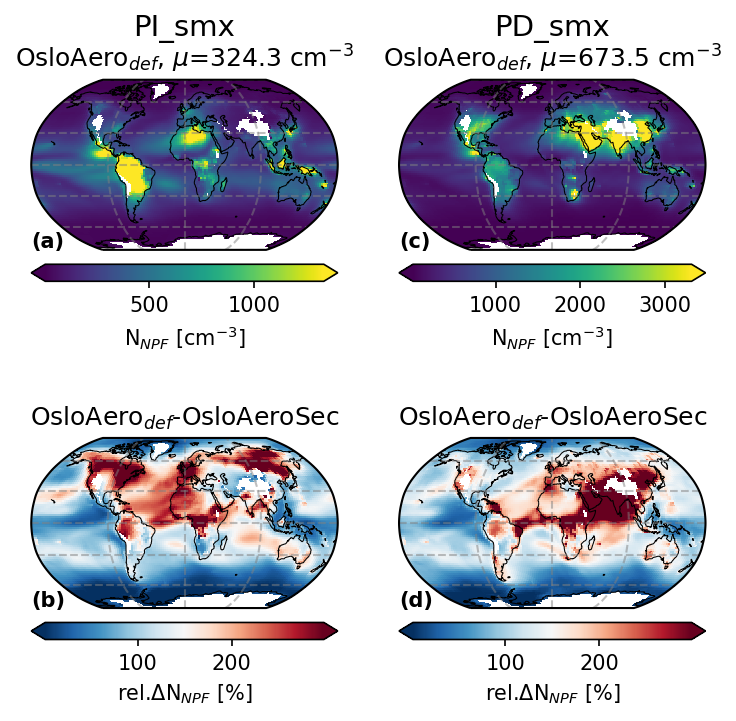

In [45]:
var = 'NCONC01'
relative = True
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   case_types=['PI_smx', 'PD_smx'],
                                   # mod_types=['OsloAeroSec','OsloAero$_{def}$'],
                                   ctrl='OsloAero$_{def}$',
                                   cases_oth=['OsloAeroSec'],
                                   type_nndic={'PI_smx': 'Pre-industrial', 'PD_smx': 'Present day'},
                                   switch_diff=True
                                   )
# fig.savefig(filen_base + f'{var}_PIPD_sep_rel{relative}.pdf', dpi=300)
fig.show()

{'norm': <matplotlib.colors.Normalize object at 0x7ffb41eea438>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb41eea438>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}


/home/ubuntu/mnts/nird/projects/SECT_SENS/sect_sens/util/plot/plot_maps.py:117: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


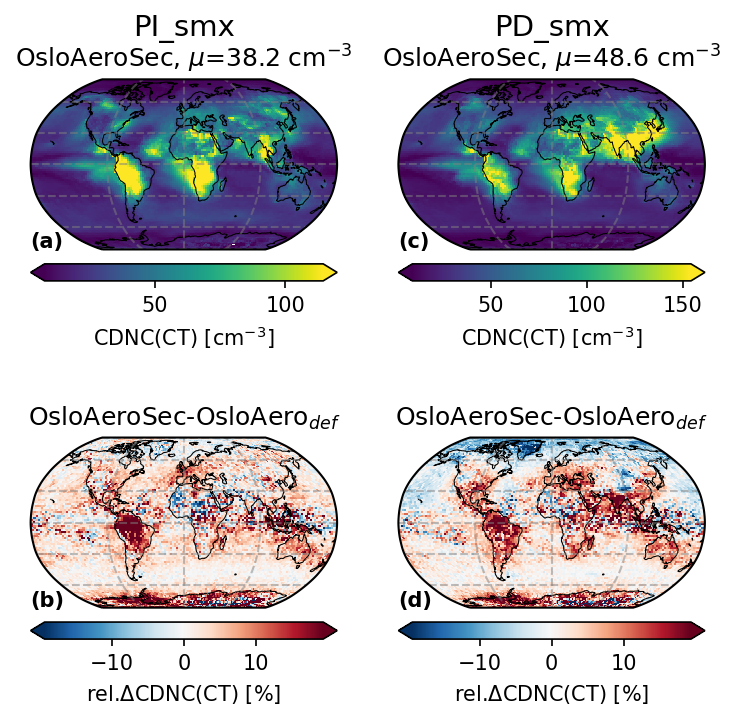

In [46]:
var = 'ACTNL_incld'
relative = True
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   case_types=['PI_smx', 'PD_smx'],
                                   # mod_types=['OsloAeroSec','OsloAero$_{def}$'],
                                   cases_oth=['OsloAero$_{def}$'],
                                   type_nndic={'PI_smx': 'Pre-industrial', 'PD_smx': 'Present day'},
                                   switch_diff=True
                                   )
# fig.savefig(filen_base + f'{var}_PIPD_sep_rel{relative}.pdf', dpi=300)
fig.show()

{'norm': <matplotlib.colors.Normalize object at 0x7ffb340d4390>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb340d4390>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}


/home/ubuntu/mnts/nird/projects/SECT_SENS/sect_sens/util/plot/plot_maps.py:117: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


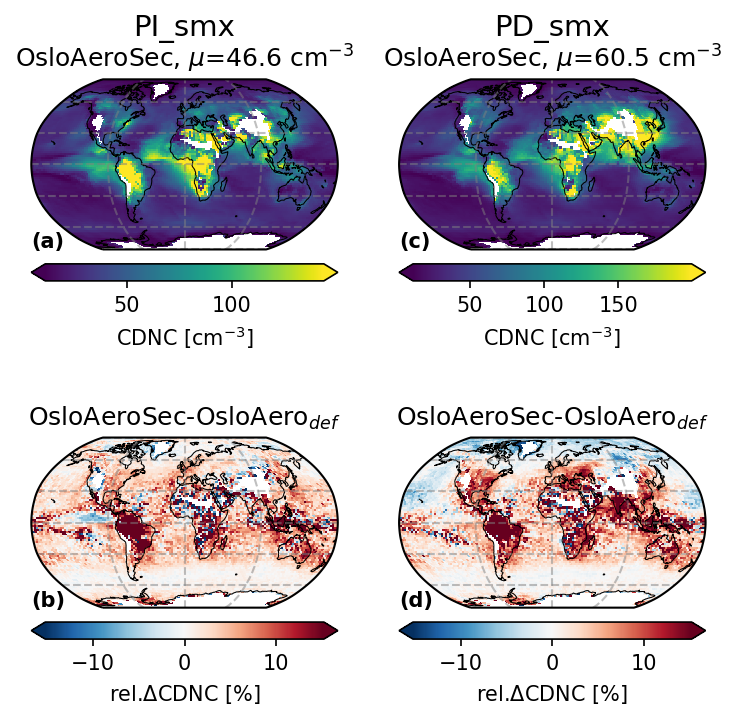

In [47]:
var = 'AWNC_incld'
relative = True
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   case_types=['PI_smx', 'PD_smx'],
                                   # mod_types=['OsloAeroSec','OsloAero$_{def}$'],
                                   cases_oth=['OsloAero$_{def}$'],
                                   type_nndic={'PI_smx': 'Pre-industrial', 'PD_smx': 'Present day'},
                                   switch_diff=True
                                   )
# fig.savefig(filen_base + f'{var}_PIPD_sep_rel{relative}.pdf', dpi=300)
fig.show()

{'norm': <matplotlib.colors.Normalize object at 0x7ffb15b55f28>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb15b55f28>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}


/home/ubuntu/mnts/nird/projects/SECT_SENS/sect_sens/util/plot/plot_maps.py:117: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


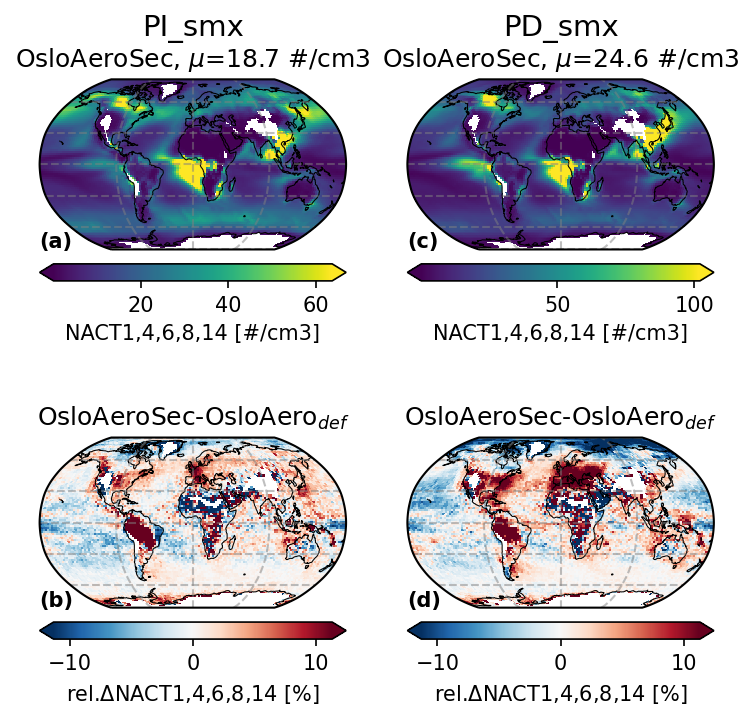

In [48]:
var = 'NACT1,4,6,8,14'
relative = True
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   case_types=['PI_smx', 'PD_smx'],
                                   # mod_types=['OsloAeroSec','OsloAero$_{def}$'],
                                   cases_oth=['OsloAero$_{def}$'],
                                   type_nndic={'PI_smx': 'Pre-industrial', 'PD_smx': 'Present day'},
                                   switch_diff=True
                                   )
fig.savefig(filen_base + f'{var}_PIPD_sep_rel{relative}.pdf', dpi=300)
fig.show()

{'norm': <matplotlib.colors.Normalize object at 0x7ffb15c7b358>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb15c7b358>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}


/home/ubuntu/mnts/nird/projects/SECT_SENS/sect_sens/util/plot/plot_maps.py:117: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


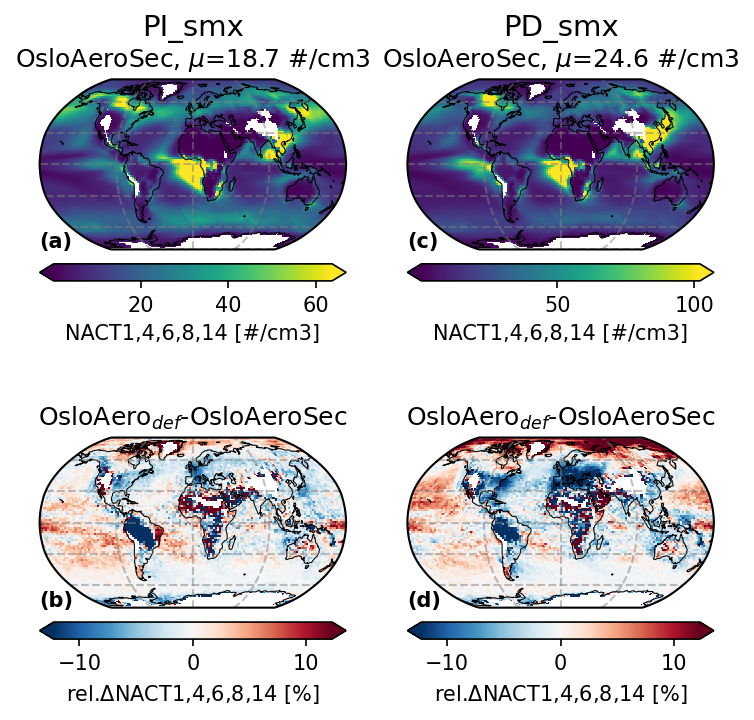

In [49]:
var = 'NACT1,4,6,8,14'
relative = True
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   case_types=['PI_smx', 'PD_smx'],
                                   # mod_types=['OsloAeroSec','OsloAero$_{def}$'],
                                   cases_oth=['OsloAero$_{def}$'],
                                   type_nndic={'PI_smx': 'Pre-industrial', 'PD_smx': 'Present day'}
                                   )
# fig.savefig(filen_base + f'{var}_PIPD_sep_rel{relative}.pdf', dpi=300)
fig.show()

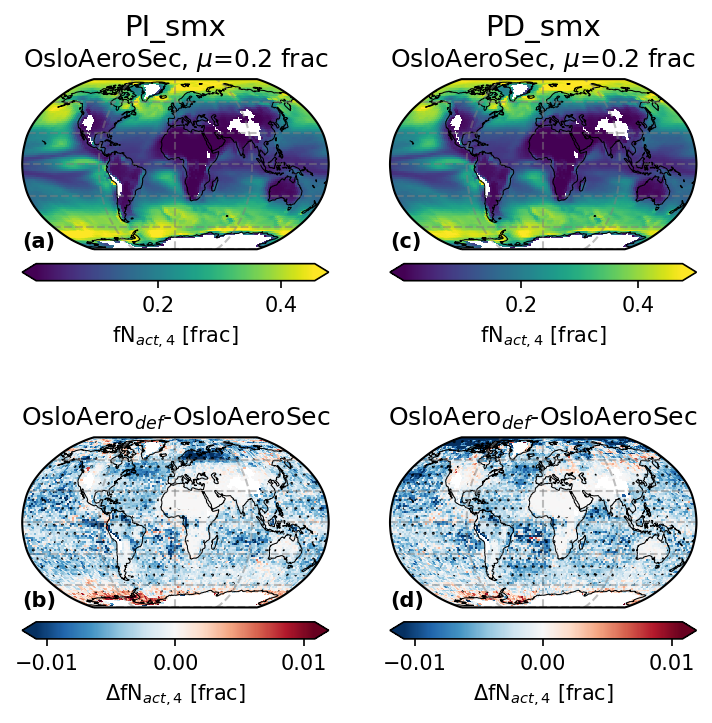

In [50]:
var = 'NACT_FRAC04'
relative = False
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   case_types=['PI_smx', 'PD_smx'],
                                   # mod_types=['OsloAeroSec','OsloAero$_{def}$'],
                                   cases_oth=['OsloAero$_{def}$'],
                                   type_nndic={'PI_smx': 'Pre-industrial', 'PD_smx': 'Present day'}
                                   )
# fig.savefig(filen_base + f'{var}_PIPD_sep_rel{relative}.pdf', dpi=300)
for ct in ['PI_smx', 'PD_smx']:
    ax_di = axs_dic[ct]
    for case_oth in cases_oth:
        ax = ax_di[case_oth]
        cs_to = get_casen_by_type_mod(ct, ctrl)
        cs_from = get_casen_by_type_mod(ct, case_oth)

        load_and_plot_sign(cs_to, [cs_from], [ax], var, startyear, endyear, pressure_adjust=pressure_adjust,
                           avg_over_lev=avg_over_lev,
                           ci=.95,
                           groupby=None,
                           dims=('lev',),
                           area='Global',
                           avg_dim='time',

                           hatches=['...', ''],
                           hatch_lw=.6,

                           transform=ccrs.PlateCarree(),
                           reverse=False)
clear_output()

fig.show()

{'norm': <matplotlib.colors.Normalize object at 0x7ffb15b75940>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb15b75940>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}


/home/ubuntu/mnts/nird/projects/SECT_SENS/sect_sens/util/plot/plot_maps.py:117: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


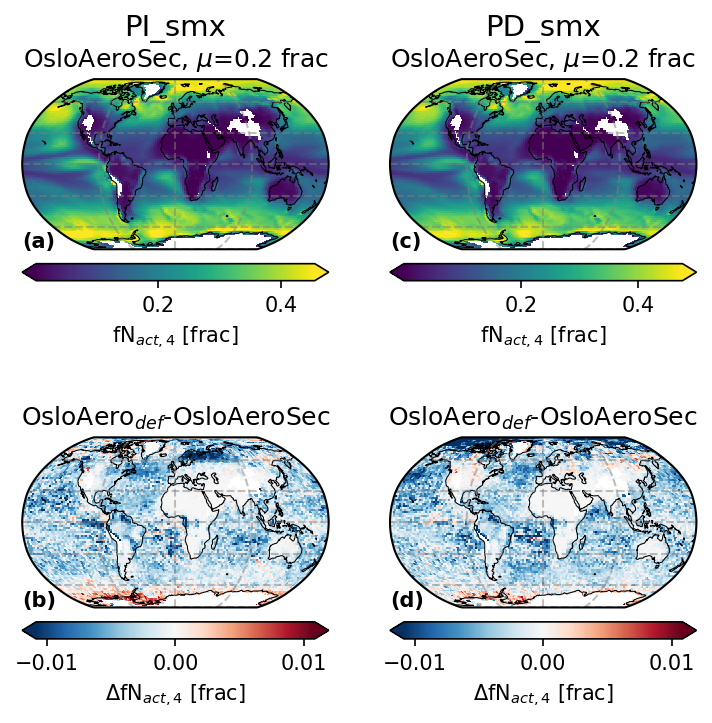

In [51]:
var = 'NACT_FRAC04'
relative = False
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   case_types=['PI_smx', 'PD_smx'],
                                   # mod_types=['OsloAeroSec','OsloAero$_{def}$'],
                                   cases_oth=['OsloAero$_{def}$'],
                                   type_nndic={'PI_smx': 'Pre-industrial', 'PD_smx': 'Present day'}
                                   )
# fig.savefig(filen_base + f'{var}_PIPD_sep_rel{relative}.pdf', dpi=300)
fig.show()

{'norm': <matplotlib.colors.Normalize object at 0x7ffb15353860>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb15353860>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}


/home/ubuntu/mnts/nird/projects/SECT_SENS/sect_sens/util/plot/plot_maps.py:117: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


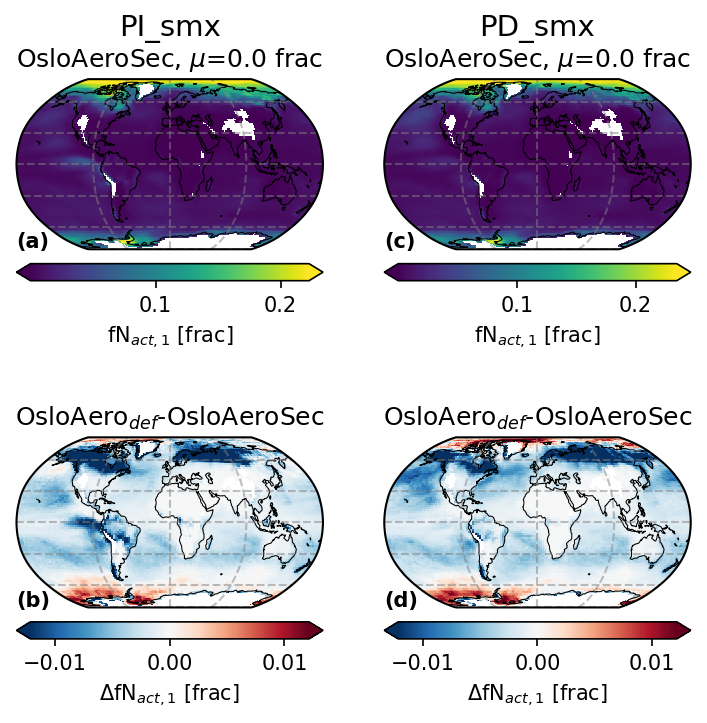

In [52]:
var = 'NACT_FRAC01'
relative = False
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   case_types=['PI_smx', 'PD_smx'],
                                   # mod_types=['OsloAeroSec','OsloAero$_{def}$'],
                                   cases_oth=['OsloAero$_{def}$'],
                                   type_nndic={'PI_smx': 'Pre-industrial', 'PD_smx': 'Present day'}
                                   )
# fig.savefig(filen_base + f'{var}_PIPD_sep_rel{relative}.pdf', dpi=300)
fig.show()

In [53]:

daf1 = dic_abs['PD_smx']['OsloAero$_{def}$']
a = lognorm.ppf(1 - daf1['NACT_FRAC01'], s=np.log(daf1['SIGMA01']), scale=daf1['NMR01'])
daf1['test'] = xr.DataArray(a, dims=daf1['NACT_FRAC01'].dims, coords=daf1['NACT_FRAC01'].coords)

/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:873: RuntimeWarning: invalid value encountered in greater
  cond = logical_and(cond, (asarray(arg) > 0))
/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1996: RuntimeWarning: invalid value encountered in greater
  cond0 = self._argcheck(*args) & (scale > 0) & (loc == loc)
/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1997: RuntimeWarning: invalid value encountered in greater
  cond1 = (0 < q) & (q < 1)
/persistent01/miniconda3/envs/env_sec_v2/lib/python3.6/site-packages/scipy/stats/_distn_infrastructure.py:1997: RuntimeWarning: invalid value encountered in less
  cond1 = (0 < q) & (q < 1)


In [54]:

daf = dic_abs['PD_smx']['OsloAeroSec']
a = lognorm.ppf(1 - daf['NACT_FRAC01'], s=np.log(daf['SIGMA01']), scale=daf['NMR01'])
daf['test'] = xr.DataArray(a, dims=daf['NACT_FRAC01'].dims, coords=daf['NACT_FRAC01'].coords)

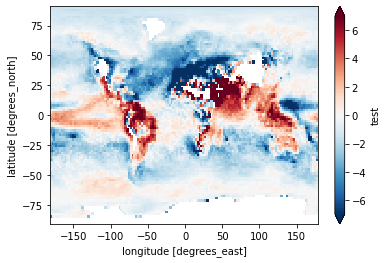

In [55]:
(daf['test'] - daf1['test']).plot(robust=True)

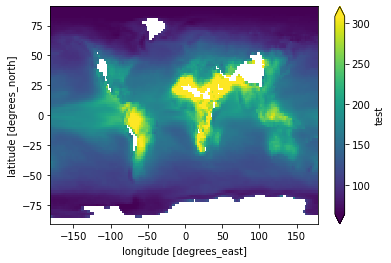

In [56]:
((daf['test']) * 2).plot(robust=True)

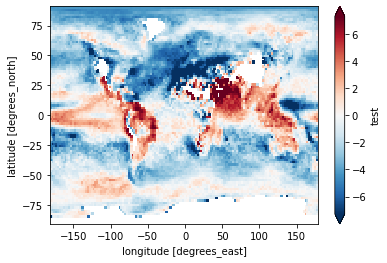

In [57]:
((daf['test'] - daf1['test']) / daf1['test'] * 100).plot(robust=True)

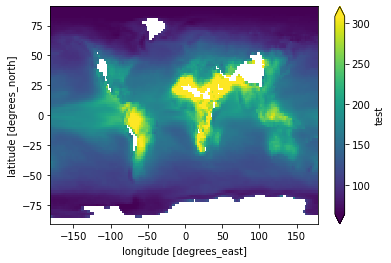

In [58]:
(2 * daf['test']).plot(robust=True)

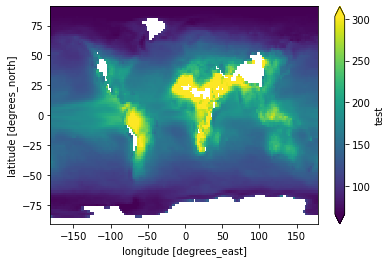

In [59]:
(2 * daf1['test']).plot(robust=True)

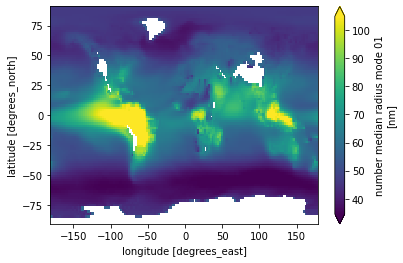

In [60]:
(2 * daf['NMR01']).plot(robust=True)

{'norm': <matplotlib.colors.Normalize object at 0x7ffb34384cc0>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb34384cc0>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}


/home/ubuntu/mnts/nird/projects/SECT_SENS/sect_sens/util/plot/plot_maps.py:117: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


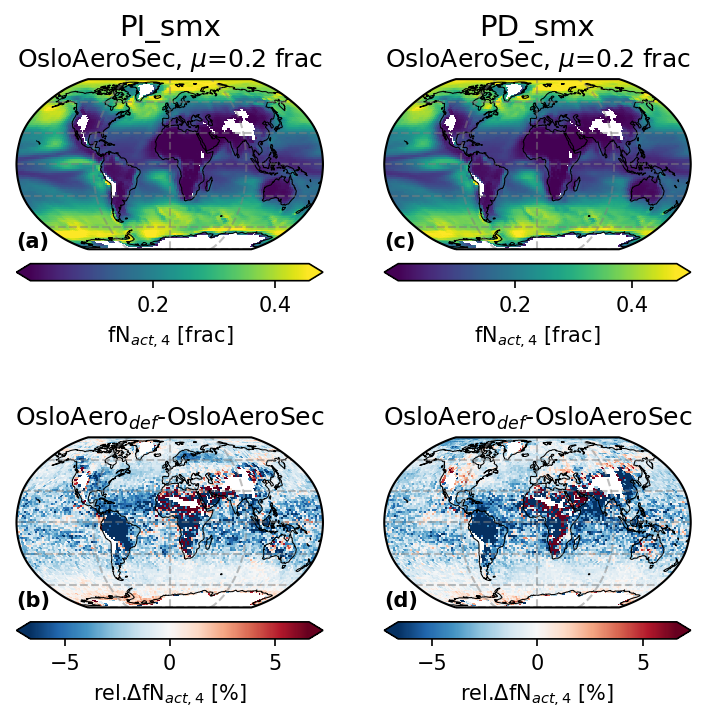

In [61]:
var = 'NACT_FRAC04'
relative = True
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   case_types=['PI_smx', 'PD_smx'],
                                   # mod_types=['OsloAeroSec','OsloAero$_{def}$'],
                                   cases_oth=['OsloAero$_{def}$'],
                                   type_nndic={'PI_smx': 'Pre-industrial', 'PD_smx': 'Present day'}
                                   )
# fig.savefig(filen_base + f'{var}_PIPD_sep_rel{relative}.pdf', dpi=300)
fig.show()

{'norm': <matplotlib.colors.Normalize object at 0x7ffb347e70f0>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb347e70f0>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}


/home/ubuntu/mnts/nird/projects/SECT_SENS/sect_sens/util/plot/plot_maps.py:117: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


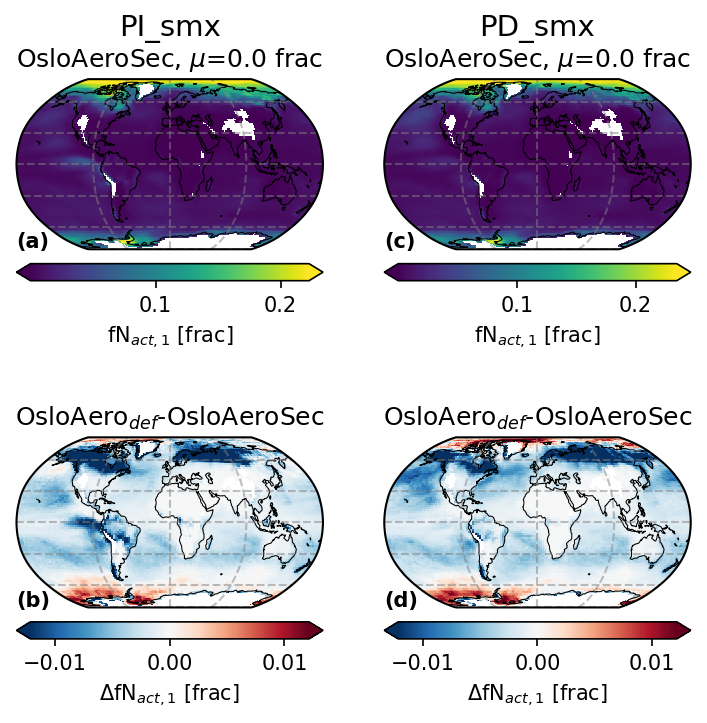

In [62]:
var = 'NACT_FRAC01'
relative = False
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   case_types=['PI_smx', 'PD_smx'],
                                   # mod_types=['OsloAeroSec','OsloAero$_{def}$'],
                                   cases_oth=['OsloAero$_{def}$'],
                                   type_nndic={'PI_smx': 'Pre-industrial', 'PD_smx': 'Present day'}
                                   )
# fig.savefig(filen_base + f'{var}_PIPD_sep_rel{relative}.pdf', dpi=300)
fig.show()

{'norm': <matplotlib.colors.Normalize object at 0x7ffb41d3b1d0>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb41d3b1d0>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}


/home/ubuntu/mnts/nird/projects/SECT_SENS/sect_sens/util/plot/plot_maps.py:117: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


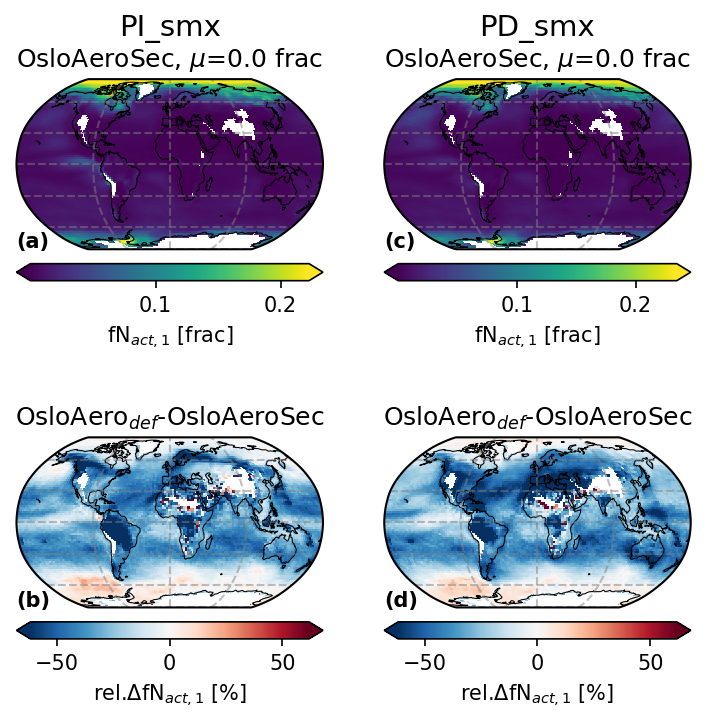

In [63]:
var = 'NACT_FRAC01'
relative = True
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   case_types=['PI_smx', 'PD_smx'],
                                   # mod_types=['OsloAeroSec','OsloAero$_{def}$'],
                                   cases_oth=['OsloAero$_{def}$'],
                                   type_nndic={'PI_smx': 'Pre-industrial', 'PD_smx': 'Present day'}
                                   )
# fig.savefig(filen_base + f'{var}_PIPD_sep_rel{relative}.pdf', dpi=300)
fig.show()

{'norm': <matplotlib.colors.Normalize object at 0x7ffb07ba1d30>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb07ba1d30>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}


/home/ubuntu/mnts/nird/projects/SECT_SENS/sect_sens/util/plot/plot_maps.py:117: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


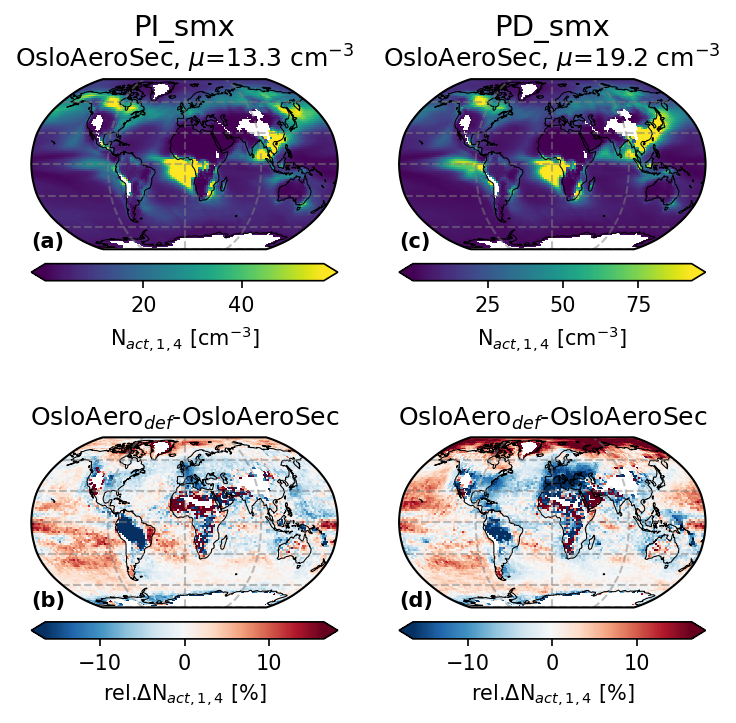

In [64]:
var = 'NACT1_4'
relative = True
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   case_types=['PI_smx', 'PD_smx'],
                                   # mod_types=['OsloAeroSec','OsloAero$_{def}$'],
                                   cases_oth=['OsloAero$_{def}$'],
                                   type_nndic={'PI_smx': 'Pre-industrial', 'PD_smx': 'Present day'}
                                   )
# fig.savefig(filen_base + f'{var}_PIPD_sep_rel{relative}.pdf', dpi=300)
fig.show()

{'norm': <matplotlib.colors.Normalize object at 0x7ffb4180e630>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb4180e630>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}


/home/ubuntu/mnts/nird/projects/SECT_SENS/sect_sens/util/plot/plot_maps.py:117: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


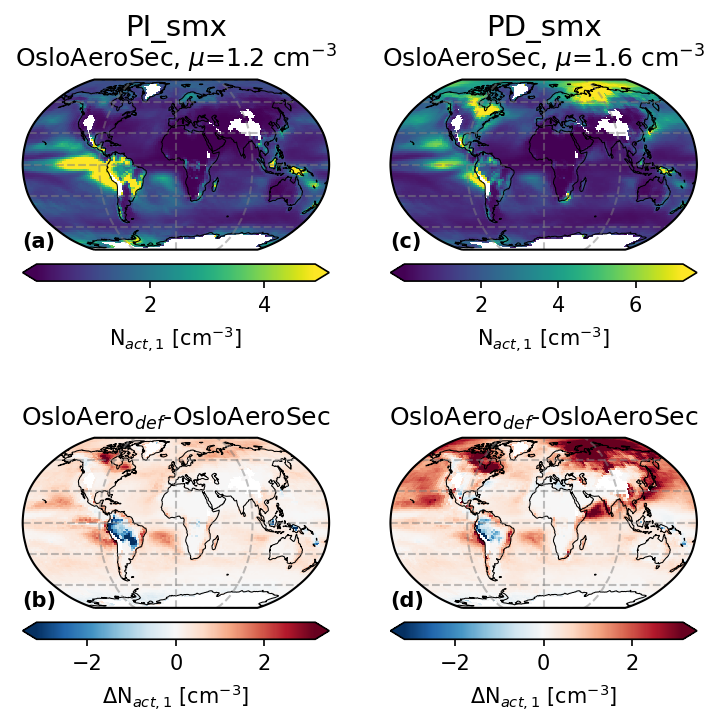

In [65]:
var = 'NACT01'
relative = False
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   case_types=['PI_smx', 'PD_smx'],
                                   # mod_types=['OsloAeroSec','OsloAero$_{def}$'],
                                   cases_oth=['OsloAero$_{def}$'],
                                   type_nndic={'PI_smx': 'Pre-industrial', 'PD_smx': 'Present day'}
                                   )
# fig.savefig(filen_base + f'{var}_PIPD_sep_rel{relative}.pdf', dpi=300)
fig.show()

{'norm': <matplotlib.colors.Normalize object at 0x7ffb34262390>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb34262390>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}


/home/ubuntu/mnts/nird/projects/SECT_SENS/sect_sens/util/plot/plot_maps.py:117: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


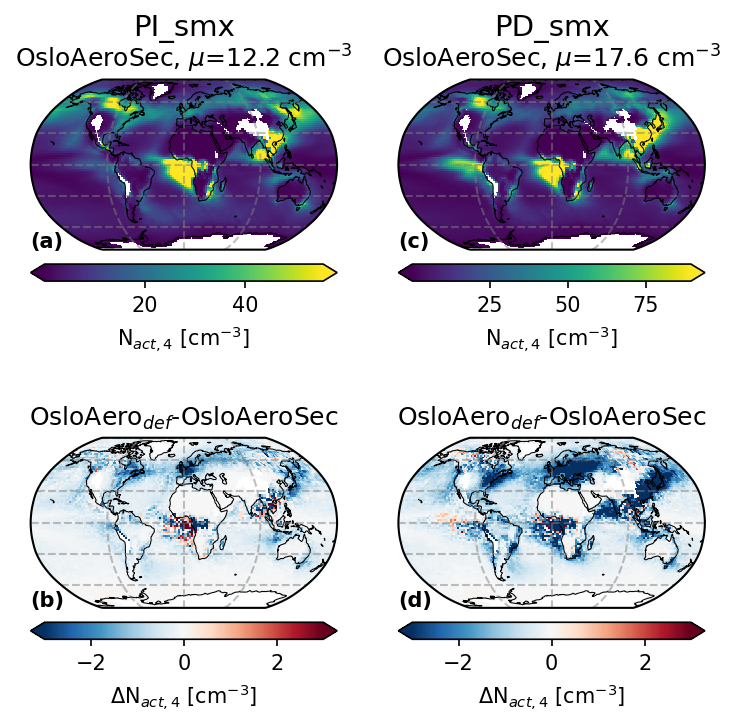

In [66]:
var = 'NACT04'
relative = False
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   case_types=['PI_smx', 'PD_smx'],
                                   # mod_types=['OsloAeroSec','OsloAero$_{def}$'],
                                   cases_oth=['OsloAero$_{def}$'],
                                   type_nndic={'PI_smx': 'Pre-industrial', 'PD_smx': 'Present day'}
                                   )
# fig.savefig(filen_base + f'{var}_PIPD_sep_rel{relative}.pdf', dpi=300)
fig.show()

{'norm': <matplotlib.colors.Normalize object at 0x7ffb41d0a6d8>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb41d0a6d8>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}


/home/ubuntu/mnts/nird/projects/SECT_SENS/sect_sens/util/plot/plot_maps.py:117: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


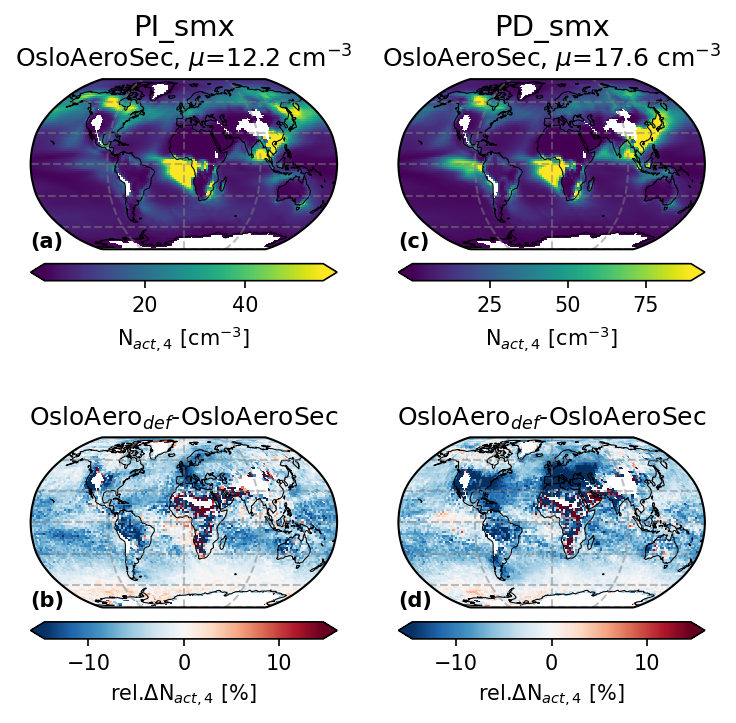

In [67]:
var = 'NACT04'
relative = True
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   case_types=['PI_smx', 'PD_smx'],
                                   # mod_types=['OsloAeroSec','OsloAero$_{def}$'],
                                   cases_oth=['OsloAero$_{def}$'],
                                   type_nndic={'PI_smx': 'Pre-industrial', 'PD_smx': 'Present day'}
                                   )
# fig.savefig(filen_base + f'{var}_PIPD_sep_rel{relative}.pdf', dpi=300)
fig.show()

{'norm': <matplotlib.colors.Normalize object at 0x7ffb148ce8d0>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb148ce8d0>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}


/home/ubuntu/mnts/nird/projects/SECT_SENS/sect_sens/util/plot/plot_maps.py:117: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


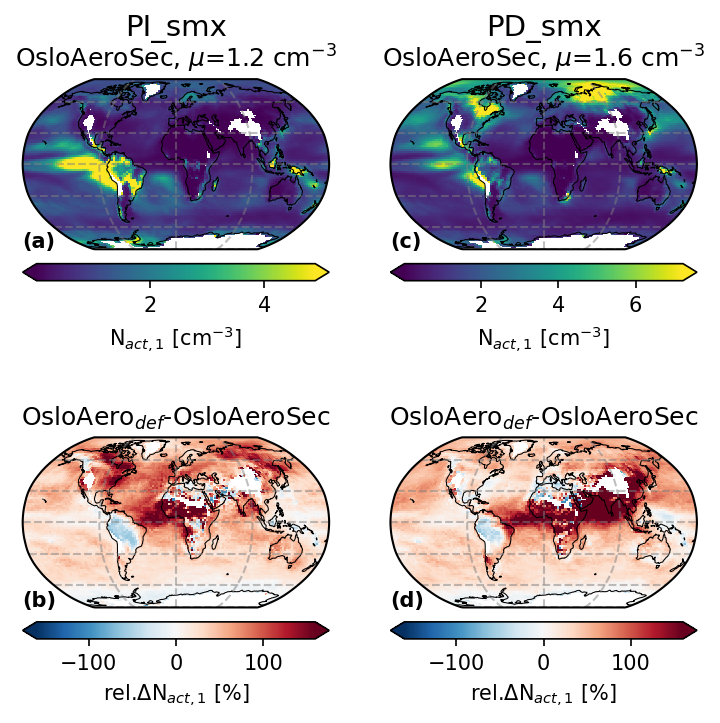

In [68]:
var = 'NACT01'
relative = True
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   case_types=['PI_smx', 'PD_smx'],
                                   # mod_types=['OsloAeroSec','OsloAero$_{def}$'],
                                   cases_oth=['OsloAero$_{def}$'],
                                   type_nndic={'PI_smx': 'Pre-industrial', 'PD_smx': 'Present day'}
                                   )
# fig.savefig(filen_base + f'{var}_PIPD_sep_rel{relative}.pdf', dpi=300)
fig.show()

{'norm': <matplotlib.colors.Normalize object at 0x7ffb14769898>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb14769898>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}


/home/ubuntu/mnts/nird/projects/SECT_SENS/sect_sens/util/plot/plot_maps.py:117: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


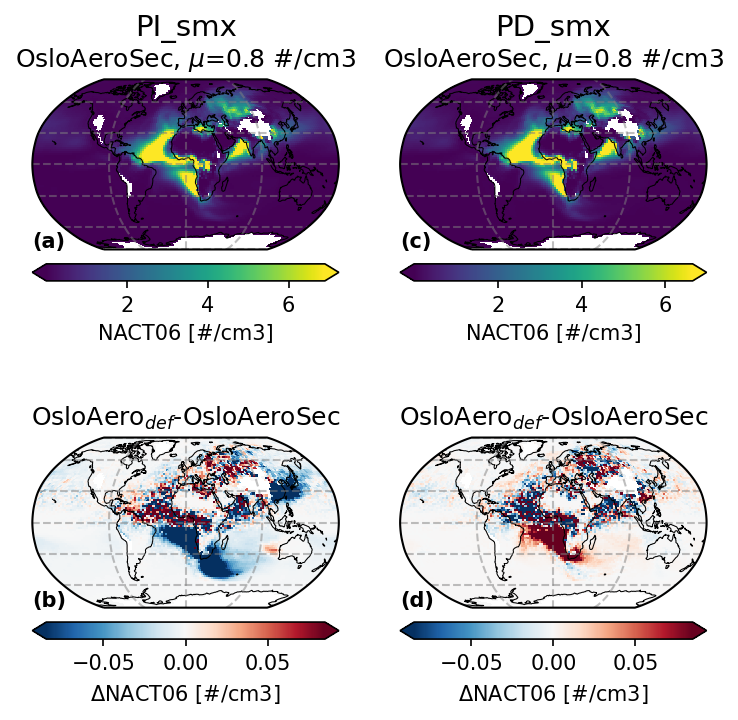

In [69]:
var = 'NACT06'
relative = False
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   case_types=['PI_smx', 'PD_smx'],
                                   # mod_types=['OsloAeroSec','OsloAero$_{def}$'],
                                   cases_oth=['OsloAero$_{def}$'],
                                   type_nndic={'PI_smx': 'Pre-industrial', 'PD_smx': 'Present day'}
                                   )
# fig.savefig(filen_base + f'{var}_PIPD_sep_rel{relative}.pdf', dpi=300)
fig.show()

{'norm': <matplotlib.colors.Normalize object at 0x7ffb14a8d400>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb14a8d400>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}


/home/ubuntu/mnts/nird/projects/SECT_SENS/sect_sens/util/plot/plot_maps.py:117: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


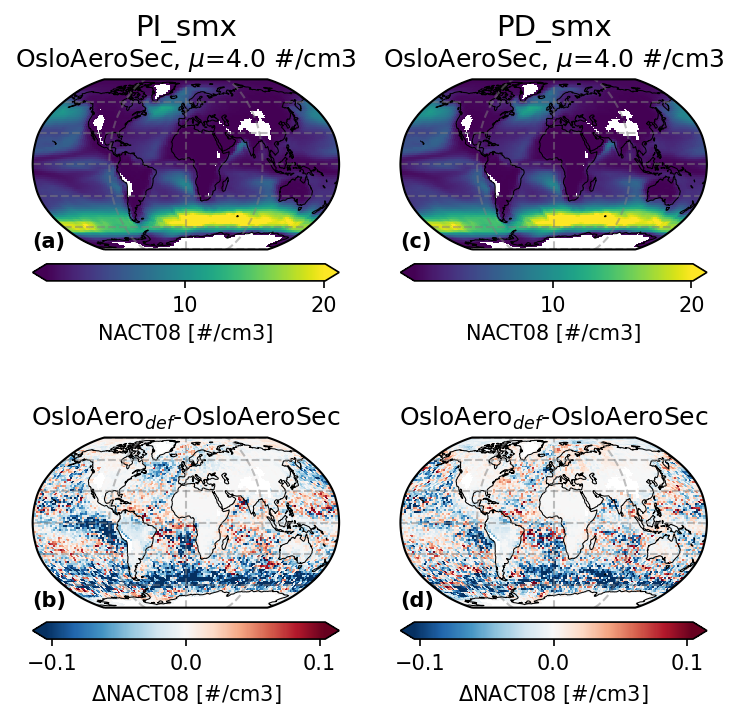

In [70]:
var = 'NACT08'
relative = False
fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                   var,
                                   relative=relative,
                                   case_types=['PI_smx', 'PD_smx'],
                                   # mod_types=['OsloAeroSec','OsloAero$_{def}$'],
                                   cases_oth=['OsloAero$_{def}$'],
                                   type_nndic={'PI_smx': 'Pre-industrial', 'PD_smx': 'Present day'}
                                   )
# fig.savefig(filen_base + f'{var}_PIPD_sep_rel{relative}.pdf', dpi=300)
fig.show()

{'norm': <matplotlib.colors.Normalize object at 0x7ffb14693be0>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb14693be0>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}


/home/ubuntu/mnts/nird/projects/SECT_SENS/sect_sens/util/plot/plot_maps.py:117: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


{'norm': <matplotlib.colors.Normalize object at 0x7ffb15261e48>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb15261e48>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}


/home/ubuntu/mnts/nird/projects/SECT_SENS/sect_sens/util/plot/plot_maps.py:117: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


{'norm': <matplotlib.colors.Normalize object at 0x7ffb345fcc88>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb345fcc88>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}


/home/ubuntu/mnts/nird/projects/SECT_SENS/sect_sens/util/plot/plot_maps.py:117: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


{'norm': <matplotlib.colors.Normalize object at 0x7ffb14d52828>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb14d52828>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}


/home/ubuntu/mnts/nird/projects/SECT_SENS/sect_sens/util/plot/plot_maps.py:117: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


{'norm': <matplotlib.colors.Normalize object at 0x7ffb41ba6e48>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb41ba6e48>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}


/home/ubuntu/mnts/nird/projects/SECT_SENS/sect_sens/util/plot/plot_maps.py:117: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


{'norm': <matplotlib.colors.Normalize object at 0x7ffb152a57f0>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb152a57f0>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}


/home/ubuntu/mnts/nird/projects/SECT_SENS/sect_sens/util/plot/plot_maps.py:117: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


{'norm': <matplotlib.colors.Normalize object at 0x7ffb152e9780>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb152e9780>, 'add_colorbar': False, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True}


/home/ubuntu/mnts/nird/projects/SECT_SENS/sect_sens/util/plot/plot_maps.py:117: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


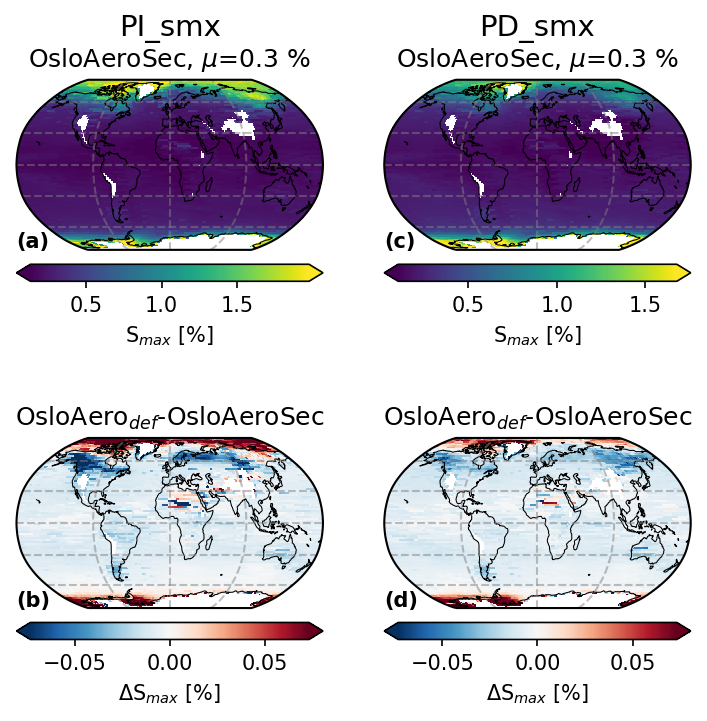

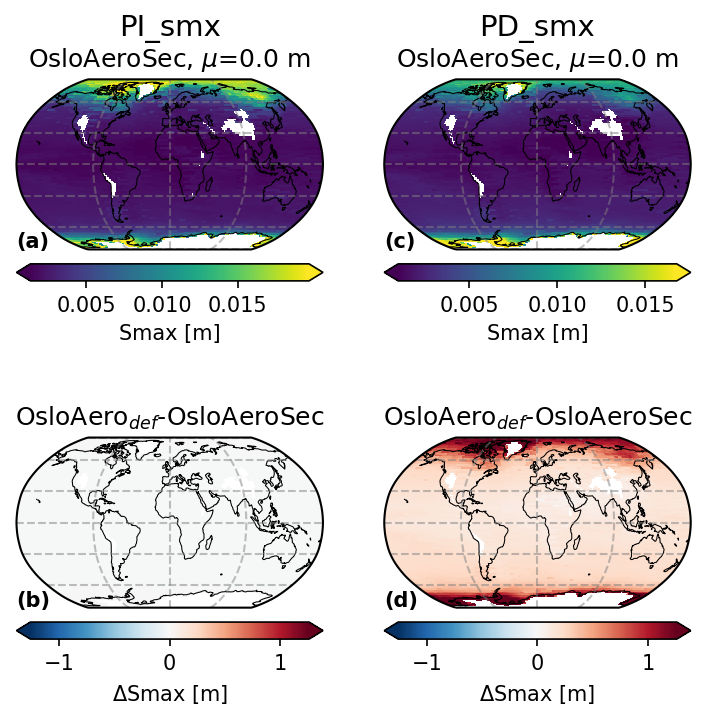

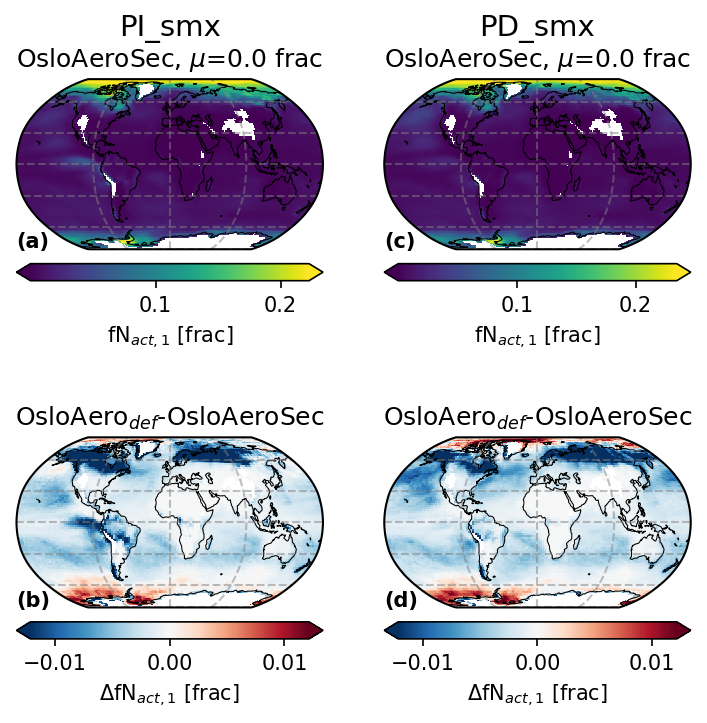

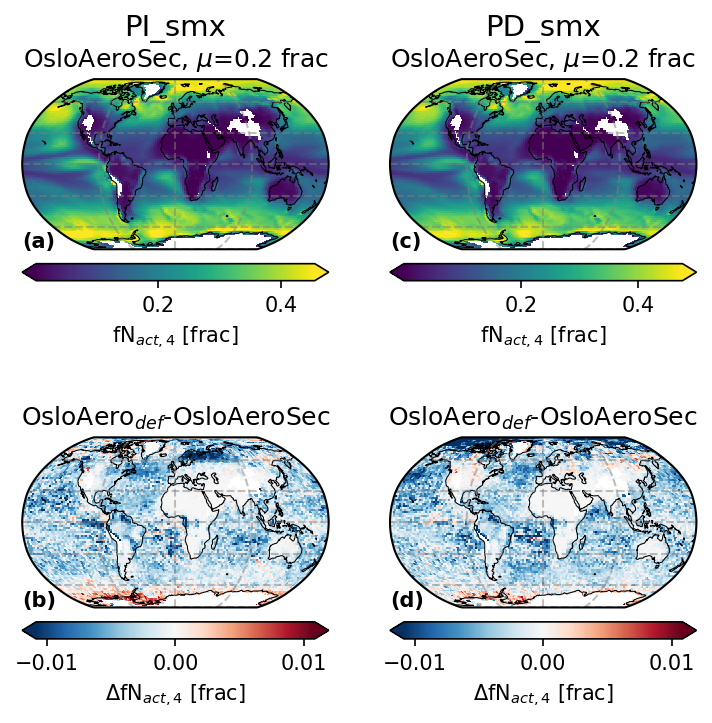

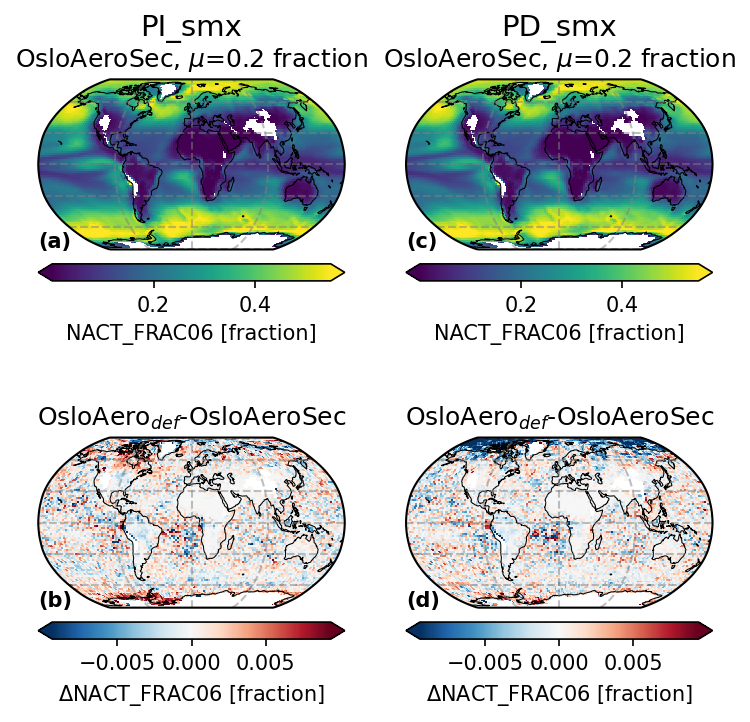

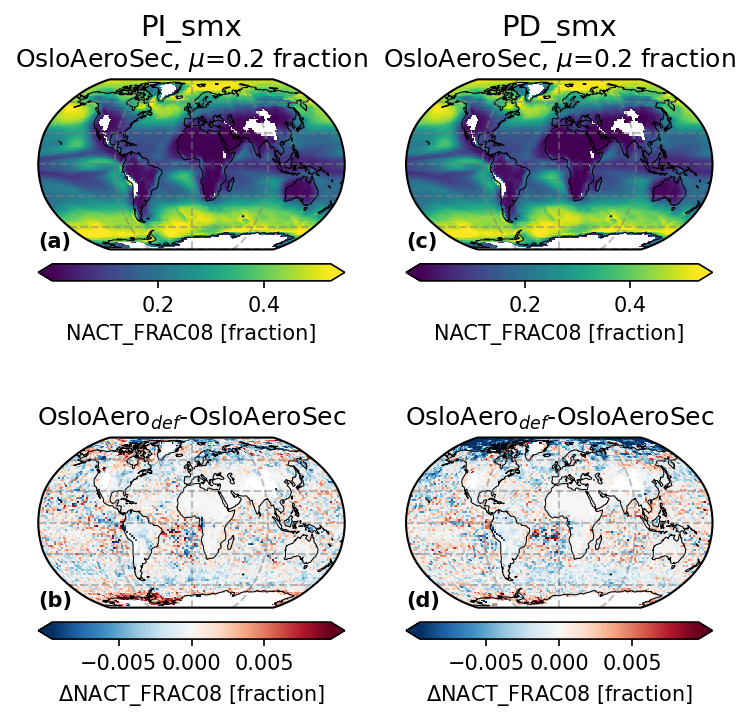

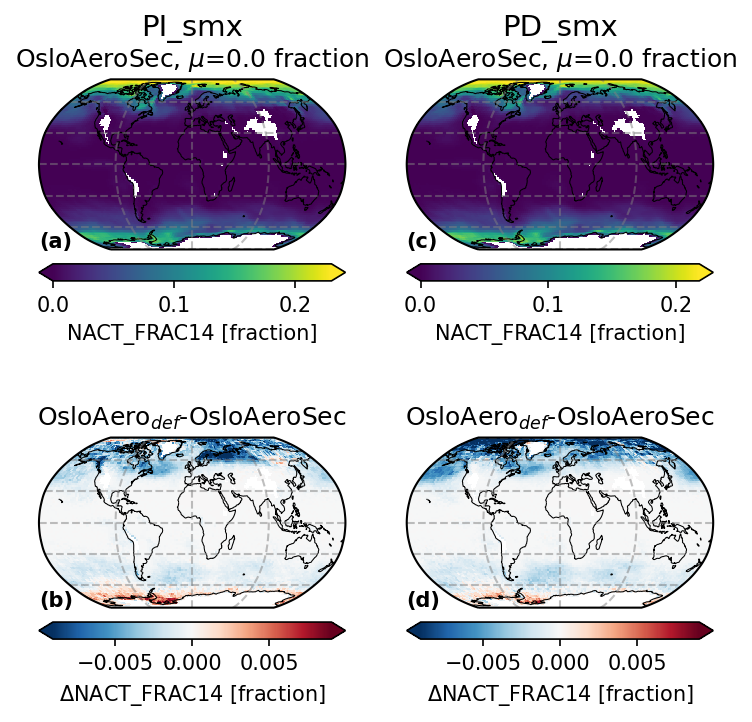

In [71]:
for var in ['Smax_w', 'Smax', 'NACT_FRAC01', 'NACT_FRAC04', 'NACT_FRAC06', 'NACT_FRAC08', 'NACT_FRAC14']:
    relative = False
    fig, axs_dic = abs_diffs_PI_PD_sep(dic_abs,
                                       var,
                                       relative=relative,
                                       case_types=['PI_smx', 'PD_smx'],
                                       # mod_types=['OsloAeroSec','OsloAero$_{def}$'],
                                       cases_oth=['OsloAero$_{def}$'],
                                       type_nndic={'PI_smx': 'Pre-industrial', 'PD_smx': 'Present day'}
                                       )
    fig.show()

In [72]:
# noinspection DuplicatedCode
norm_dic = dict(
    SOA_LV=colors.SymLogNorm(vmin=-5e-1, vmax=5e-1, linthresh=.01, base=10, linscale=.4),
    H2SO4=colors.SymLogNorm(vmin=-5e-1, vmax=5e-1, linthresh=.01, base=10, linscale=.4),
    NCONC01=colors.SymLogNorm(vmin=-1e3, vmax=1e3, linthresh=10, base=10, linscale=.4),
    NMR01=colors.SymLogNorm(vmin=-10, vmax=10, linthresh=1, base=10),  # linscale=.5),
    AWNC_incld=colors.SymLogNorm(vmin=-50, vmax=50, linthresh=1, base=10),
    ACTNL_incld=colors.SymLogNorm(vmin=-40, vmax=40, linthresh=1, linscale=0.4, base=10),
    AREL_incld=colors.SymLogNorm(vmin=-5, vmax=5, linthresh=.1, base=10),
    ACTREL_incld=colors.SymLogNorm(vmin=-7, vmax=7, linthresh=.1, base=10, linscale=0.5),
    CDNUMC=None,
    SWCF_Ghan=colors.Normalize(vmin=-2, vmax=2),
    LWCF_Ghan=colors.Normalize(vmin=-2, vmax=2),
    NCFT_Ghan=colors.Normalize(vmin=-2, vmax=2),

)
norm_dic_rel = dict(
    SOA_LV=colors.Normalize(vmin=-50, vmax=50),
    H2SO4=colors.Normalize(vmin=-50, vmax=50),
    NCONC01=colors.Normalize(vmin=-250, vmax=250),
    NMR01=colors.Normalize(vmin=-50, vmax=50),
    AWNC_incld=colors.Normalize(vmin=-50, vmax=50),
    ACTNL_incld=colors.Normalize(vmin=-13, vmax=13),
    AREL_incld=colors.Normalize(vmin=-10, vmax=10),
    ACTREL_incld=colors.Normalize(vmin=-7, vmax=7),
    CDNUMC=colors.Normalize(vmin=-12, vmax=12),

    SWCF_Ghan=colors.Normalize(vmin=-2, vmax=2),
    LWCF_Ghan=colors.Normalize(vmin=-2, vmax=2),
    NCFT_Ghan=colors.Normalize(vmin=-2, vmax=2),

)

norm_abs = norm_dic.copy()
norm_abs['SWCF_Ghan'] = colors.Normalize(vmin=-5, vmax=5)
norm_abs['LWCF_Ghan'] = colors.Normalize(vmin=-3, vmax=3)
norm_abs['NCFT_Ghan'] = colors.Normalize(vmin=-5, vmax=5)

In [73]:
norm_diff_dic = dict(
    ACTNL_incld=colors.SymLogNorm(vmin=-50, vmax=50, linthresh=1, base=10),
    N50=colors.Normalize(vmin=-45, vmax=45),
    N100=colors.Normalize(vmin=-20, vmax=20),
    N150=colors.Normalize(vmin=-10, vmax=10),  # colors.Normalize(vmin=-5, vmax=5),
    N200=colors.Normalize(vmin=-15, vmax=15),  # colors.Normalize(vmin=-5, vmax=5),
    NACT01=colors.SymLogNorm(vmin=-10, vmax=10, linthresh=.1, base=10),
    NACT04=colors.SymLogNorm(vmin=-10, vmax=10, linthresh=.1, base=10),
    NACT1_4=colors.SymLogNorm(vmin=-10, vmax=10, linthresh=.1, base=10),
    NCONC01=colors.SymLogNorm(vmin=-100, vmax=100, linthresh=10, base=10),
    NCONC04=colors.SymLogNorm(vmin=-10, vmax=10, linthresh=1, base=10)
)

{'norm': <matplotlib.colors.SymLogNorm object at 0x7ffb07fe22b0>, 'add_colorbar': True, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True, 'cbar_kwargs': {'aspect': 12, 'label': '$\\Delta$CDNC(CT) [cm$^{-3}$]', 'shrink': 0.95}}
{'norm': <matplotlib.colors.SymLogNorm object at 0x7ffb07e4d860>, 'add_colorbar': True, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True, 'cbar_kwargs': {'aspect': 12, 'label': '$\\Delta$N$_{act,1,4}$ [cm$^{-3}$]', 'shrink': 0.95}}
{'norm': <matplotlib.colors.SymLogNorm object at 0x7ffb07e4dfd0>, 'add_colorbar': True, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True, 'cbar_kwargs': {'aspect': 12, 'label': '$\\Delta$N$_{act,1}$ [cm$^{-3}$]', 'shrink': 0.95}}
{'norm': <matplotlib.colors.SymLogNorm object at 0x7ffb07e4db38>, 'add_colorbar': True, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True, 'cbar_kwargs': {'aspect': 12, 'label': '$\\Delta$N$_{act,4}$ [cm$^{-3}$]', 'shrink': 0.95}}
{'norm': <matplotlib.colors.SymLogNorm object at 0x7ffb07fe22b0>,

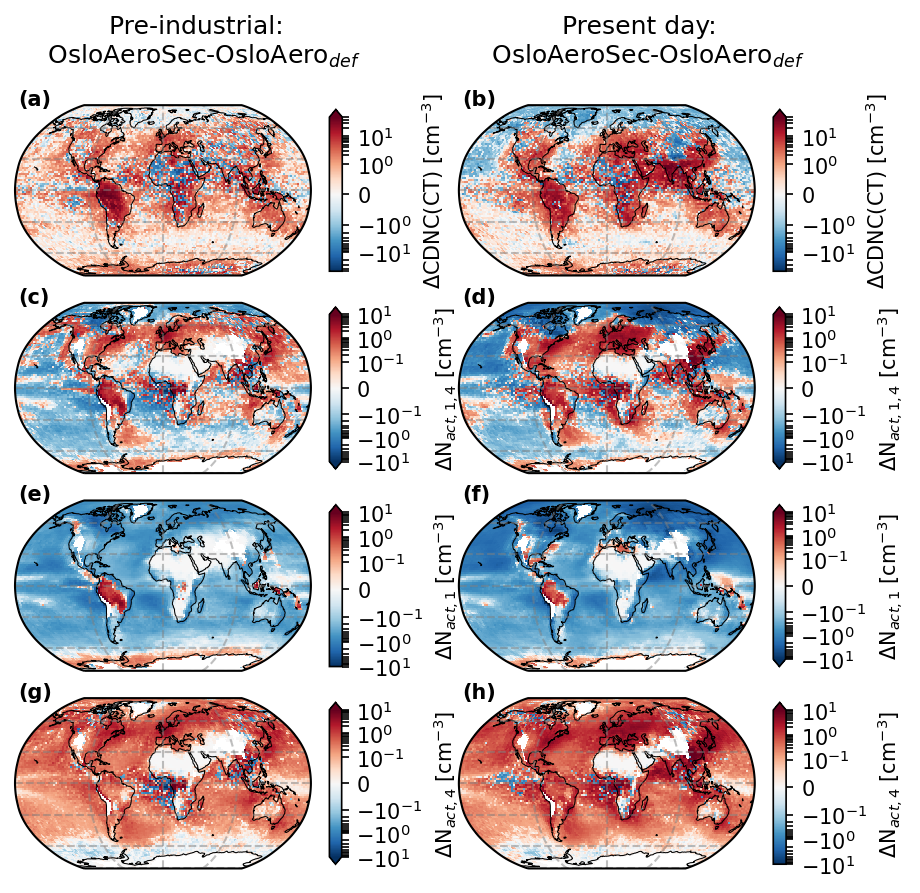

In [74]:
varl = ['ACTNL_incld', 'N100', 'N150', 'N200']  # ,'N250'] #'N50',
varl = ['ACTNL_incld', 'NACT1_4', 'NACT01', 'NACT04']  # ,'N200']#,'N250'] #'N50',

ctrl = 'OsloAero$_{def}$'
case_oth = 'OsloAeroSec'
relative = False

fg, axs = diffs_PI_PD_sep(dic_abs,
                          varl,
                          case_types=['PI_smx', 'PD_smx'],
                          ctrl=ctrl,
                          case_oth=case_oth,
                          sfg_size=3.5,
                          asp_rat=.5,
                          relative=relative,
                          norm_diff_dic=norm_diff_dic,
                          type_nndic={'PI_smx': 'Pre-industrial', 'PD_smx': 'Present day'},
                          height_ratios=None
                          )
vl = '_'.join(varl)

cc1 = ctrl.replace('$', '').replace('{', '').replace('}', '')
cc2 = case_oth.replace('$', '').replace('{', '').replace('}', '')
fn = filen_base + f'{vl}_{cc2}_{cc1}_sep_rel{relative}.pdf'
fg.savefig(fn, dpi=300)
fg.show()

{'norm': <matplotlib.colors.Normalize object at 0x7ffb4010e908>, 'add_colorbar': True, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True, 'cbar_kwargs': {'aspect': 12, 'label': 'rel.$\\Delta$CDNC(CT) [%]', 'shrink': 0.95}}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb1518ef98>, 'add_colorbar': True, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True, 'cbar_kwargs': {'aspect': 12, 'label': 'rel.$\\Delta$N$_{act,1,4}$ [%]', 'shrink': 0.95}}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb41cfe0f0>, 'add_colorbar': True, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True, 'cbar_kwargs': {'aspect': 12, 'label': 'rel.$\\Delta$N$_{act,1}$ [%]', 'shrink': 0.95}}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb41f47cf8>, 'add_colorbar': True, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True, 'cbar_kwargs': {'aspect': 12, 'label': 'rel.$\\Delta$N$_{act,4}$ [%]', 'shrink': 0.95}}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb4010e908>, 'add_colorbar': True

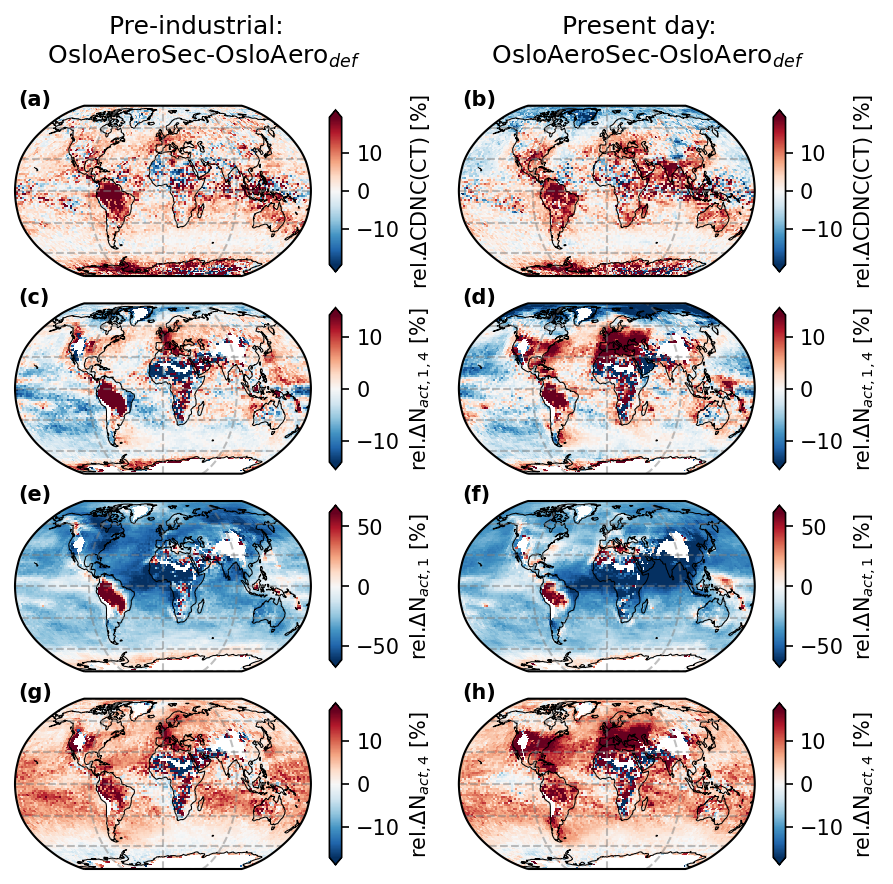

In [75]:
varl = ['ACTNL_incld', 'N100', 'N150', 'N200']  # ,'N250'] #'N50',
varl = ['ACTNL_incld', 'NACT1_4', 'NACT01', 'NACT04']  # ,'N200']#,'N250'] #'N50',

ctrl = 'OsloAero$_{def}$'
case_oth = 'OsloAeroSec'
relative = True

fg, axs = diffs_PI_PD_sep(dic_abs,
                          varl,
                          case_types=['PI_smx', 'PD_smx'],
                          ctrl=ctrl,
                          case_oth=case_oth,
                          sfg_size=3.5,
                          asp_rat=.5,
                          relative=relative,
                          # norm_diff_dic=norm_diff_dic,
                          type_nndic={'PI_smx': 'Pre-industrial', 'PD_smx': 'Present day'},
                          height_ratios=None
                          )
vl = '_'.join(varl)

cc1 = ctrl.replace('$', '').replace('{', '').replace('}', '')
cc2 = case_oth.replace('$', '').replace('{', '').replace('}', '')
fn = filen_base + f'{vl}_{cc2}_{cc1}_sep_rel{relative}.pdf'
fg.savefig(fn, dpi=300)
fig.show()

{'norm': <matplotlib.colors.Normalize object at 0x7ffb34577390>, 'add_colorbar': True, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True, 'cbar_kwargs': {'aspect': 12, 'label': '$\\Delta$CDNC(CT) [cm$^{-3}$]', 'shrink': 0.95}}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb34491d30>, 'add_colorbar': True, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True, 'cbar_kwargs': {'aspect': 12, 'label': '$\\Delta$fN$_{act,1}$ [frac]', 'shrink': 0.95}}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb34491748>, 'add_colorbar': True, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True, 'cbar_kwargs': {'aspect': 12, 'label': '$\\Delta$fN$_{act,4}$ [frac]', 'shrink': 0.95}}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb34577390>, 'add_colorbar': True, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True, 'cbar_kwargs': {'aspect': 12, 'label': '$\\Delta$CDNC(CT) [cm$^{-3}$]', 'shrink': 0.95}}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb34491d30>, 'add_colorbar': T

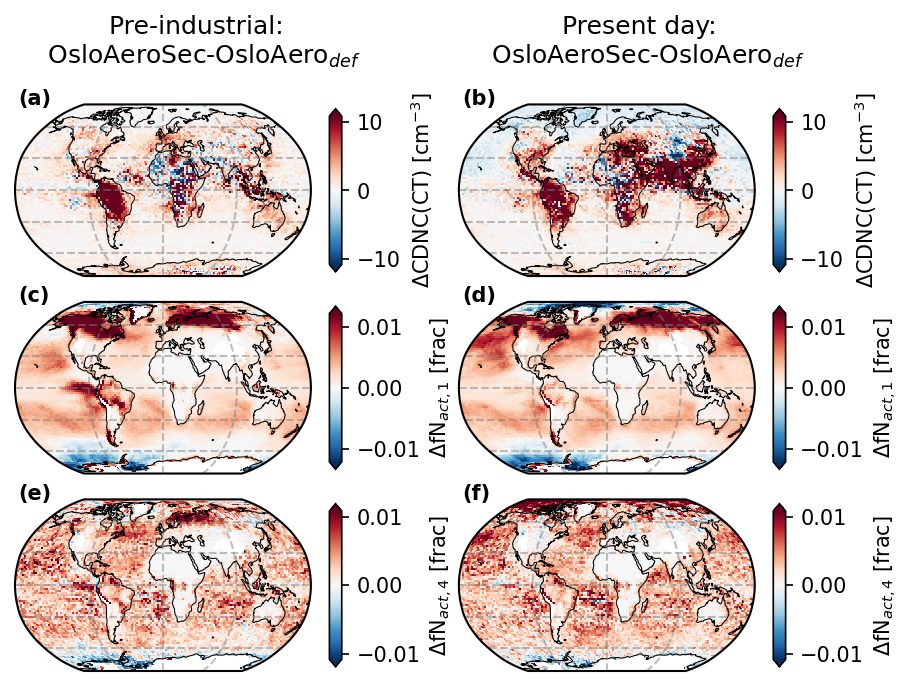

In [76]:
varl = ['ACTNL_incld', 'N100', 'N150', 'N200']  # ,'N250'] #'N50',
varl = ['ACTNL_incld', 'NACT_FRAC01', 'NACT_FRAC04']  # ,'NACT04']#,'N200']#,'N250'] #'N50',

ctrl = 'OsloAero$_{def}$'
case_oth = 'OsloAeroSec'
relative = False

fg, axs = diffs_PI_PD_sep(dic_abs,
                          varl,
                          case_types=['PI_smx', 'PD_smx'],
                          ctrl=ctrl,
                          case_oth=case_oth,
                          sfg_size=3.5,
                          asp_rat=.5,
                          relative=relative,
                          # norm_diff_dic=norm_diff_dic,
                          type_nndic={'PI_smx': 'Pre-industrial', 'PD_smx': 'Present day'},
                          height_ratios=None
                          )
vl = '_'.join(varl)

cc1 = ctrl.replace('$', '').replace('{', '').replace('}', '')
cc2 = case_oth.replace('$', '').replace('{', '').replace('}', '')
fn = filen_base + f'{vl}_{cc2}_{cc1}_sep_rel{relative}.pdf'
fg.savefig(fn, dpi=300)
fg.show()

{'norm': <matplotlib.colors.Normalize object at 0x7ffb151e5f98>, 'add_colorbar': True, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True, 'cbar_kwargs': {'aspect': 12, 'label': 'rel.$\\Delta$CDNC(CT) [%]', 'shrink': 0.95}}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb42166fd0>, 'add_colorbar': True, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True, 'cbar_kwargs': {'aspect': 12, 'label': 'rel.$\\Delta$fN$_{act,1}$ [%]', 'shrink': 0.95}}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb42dfa588>, 'add_colorbar': True, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True, 'cbar_kwargs': {'aspect': 12, 'label': 'rel.$\\Delta$fN$_{act,4}$ [%]', 'shrink': 0.95}}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb151e5f98>, 'add_colorbar': True, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True, 'cbar_kwargs': {'aspect': 12, 'label': 'rel.$\\Delta$CDNC(CT) [%]', 'shrink': 0.95}}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb42166fd0>, 'add_colorbar': True, '

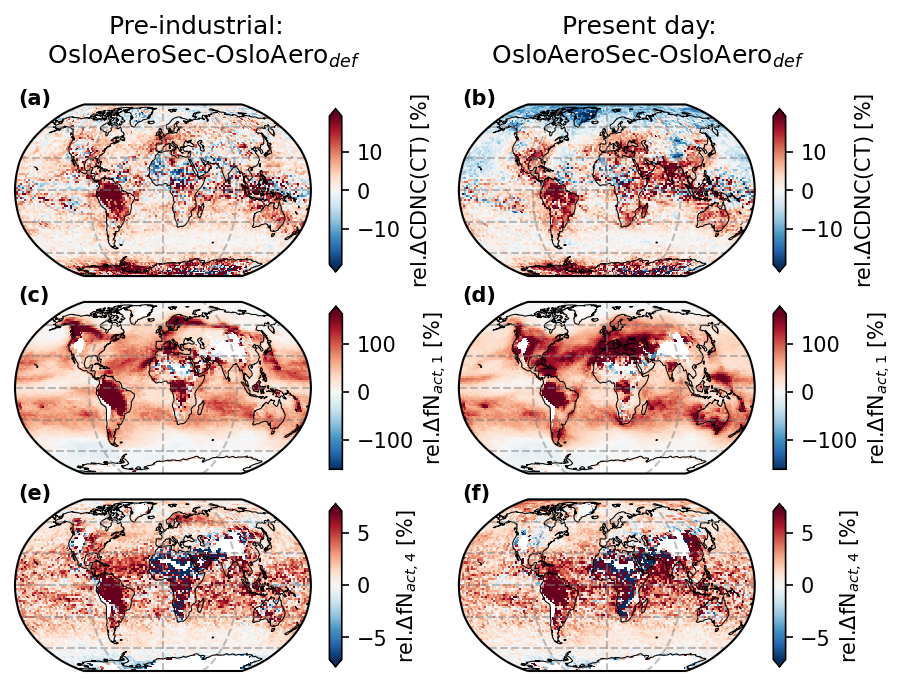

In [77]:
varl = ['ACTNL_incld', 'N100', 'N150', 'N200']  # ,'N250'] #'N50',
varl = ['ACTNL_incld', 'NACT_FRAC01', 'NACT_FRAC04']  # ,'NACT04']#,'N200']#,'N250'] #'N50',

ctrl = 'OsloAero$_{def}$'
case_oth = 'OsloAeroSec'
relative = True

fg, axs = diffs_PI_PD_sep(dic_abs,
                          varl,
                          case_types=['PI_smx', 'PD_smx'],
                          ctrl=ctrl,
                          case_oth=case_oth,
                          sfg_size=3.5,
                          asp_rat=.5,
                          relative=relative,
                          # norm_diff_dic=norm_diff_dic,
                          type_nndic={'PI_smx': 'Pre-industrial', 'PD_smx': 'Present day'},
                          height_ratios=None
                          )
vl = '_'.join(varl)

cc1 = ctrl.replace('$', '').replace('{', '').replace('}', '')
cc2 = case_oth.replace('$', '').replace('{', '').replace('}', '')
fn = filen_base + f'{vl}_{cc2}_{cc1}_sep_rel{relative}.pdf'
fg.savefig(fn, dpi=300)
fig.show()

{'norm': <matplotlib.colors.Normalize object at 0x7ffb07c42978>, 'add_colorbar': True, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True, 'cbar_kwargs': {'aspect': 12, 'label': 'rel.$\\Delta$CDNC(CT) [%]', 'shrink': 0.95}}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb42e66080>, 'add_colorbar': True, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True, 'cbar_kwargs': {'aspect': 12, 'label': 'rel.$\\Delta$N$_{NPF}$ [%]', 'shrink': 0.95}}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb416a4278>, 'add_colorbar': True, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True, 'cbar_kwargs': {'aspect': 12, 'label': 'rel.$\\Delta$NCONC04 [%]', 'shrink': 0.95}}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb07c42978>, 'add_colorbar': True, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True, 'cbar_kwargs': {'aspect': 12, 'label': 'rel.$\\Delta$CDNC(CT) [%]', 'shrink': 0.95}}
{'norm': <matplotlib.colors.Normalize object at 0x7ffb42e66080>, 'add_colorbar': True, 'rasteriz

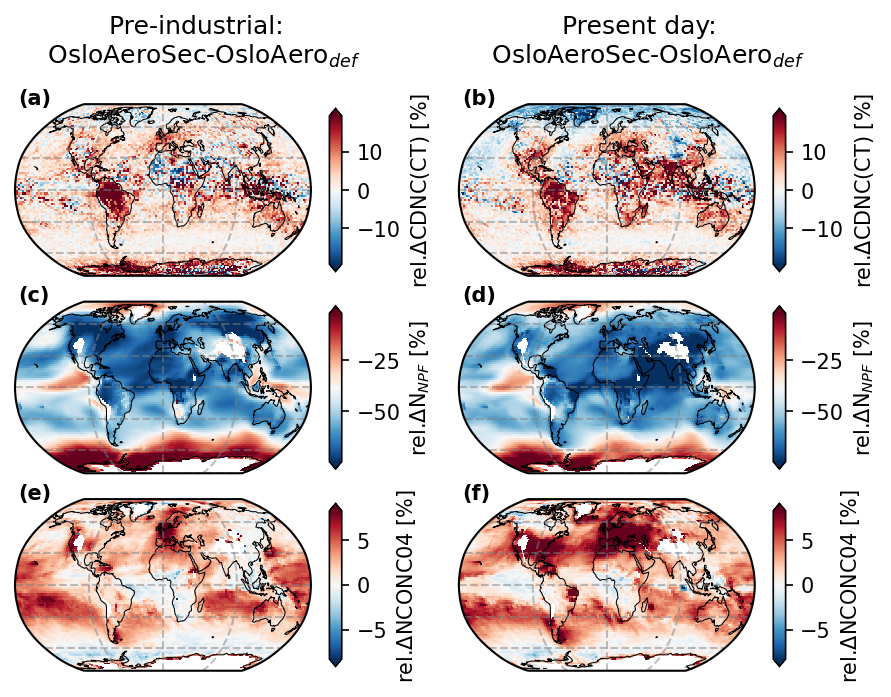

In [78]:
varl = ['ACTNL_incld', 'N100', 'N150', 'N200']  # ,'N250'] #'N50',
varl = ['ACTNL_incld', 'NCONC01', 'NCONC04']  # ,'N200']#,'N250'] #'N50',

ctrl = 'OsloAero$_{def}$'
case_oth = 'OsloAeroSec'
relative = True

fg, axs = diffs_PI_PD_sep(dic_abs,
                          varl,
                          case_types=['PI_smx', 'PD_smx'],
                          ctrl=ctrl,
                          case_oth=case_oth,
                          sfg_size=3.5,
                          asp_rat=.5,
                          relative=relative,
                          # norm_diff_dic=norm_diff_dic,
                          type_nndic={'PI_smx': 'Pre-industrial', 'PD_smx': 'Present day'},
                          height_ratios=None
                          )
vl = '_'.join(varl)

# cc1 = ctrl.replace('$','').replace('{','').replace('}','')
# cc2 = case_oth.replace('$','').replace('{','').replace('}','')
# fn = filen_base + f'{vl}_{cc2}_{cc1}_sep_rel{relative}.pdf'
# fg.savefig(fn, dpi=300)
fg.show()

{'norm': <matplotlib.colors.SymLogNorm object at 0x7ffb07fe22b0>, 'add_colorbar': True, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True, 'cbar_kwargs': {'aspect': 12, 'label': 'rel.$\\Delta$CDNC(CT) [%]', 'shrink': 0.95}}
{'norm': <matplotlib.colors.SymLogNorm object at 0x7ffb07e4dfd0>, 'add_colorbar': True, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True, 'cbar_kwargs': {'aspect': 12, 'label': 'rel.$\\Delta$N$_{act,1}$ [%]', 'shrink': 0.95}}
{'norm': <matplotlib.colors.SymLogNorm object at 0x7ffb07e4db38>, 'add_colorbar': True, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True, 'cbar_kwargs': {'aspect': 12, 'label': 'rel.$\\Delta$N$_{act,4}$ [%]', 'shrink': 0.95}}
{'norm': <matplotlib.colors.SymLogNorm object at 0x7ffb07fe22b0>, 'add_colorbar': True, 'rasterized': True, 'cmap': 'RdBu_r', 'robust': True, 'cbar_kwargs': {'aspect': 12, 'label': 'rel.$\\Delta$CDNC(CT) [%]', 'shrink': 0.95}}
{'norm': <matplotlib.colors.SymLogNorm object at 0x7ffb07e4dfd0>, 'add_colorbar': True

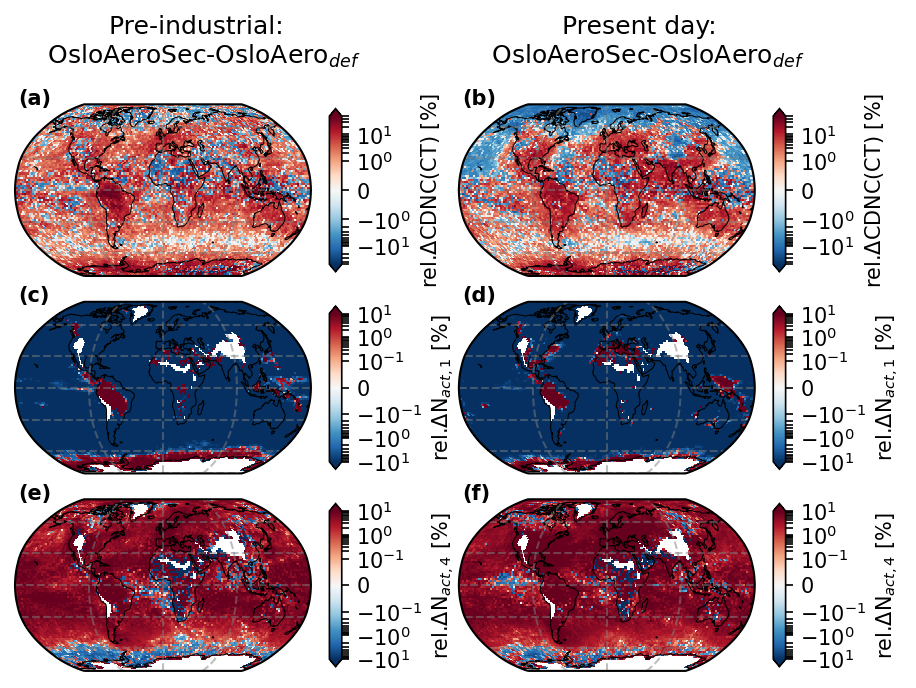

In [79]:
varl = ['ACTNL_incld', 'N100', 'N150', 'N200']  # ,'N250'] #'N50',
varl = ['ACTNL_incld', 'NACT01', 'NACT04']  # ,'N200']#,'N250'] #'N50',

ctrl = 'OsloAero$_{def}$'
case_oth = 'OsloAeroSec'
relative = True

fg, axs = diffs_PI_PD_sep(dic_abs,
                          varl,
                          case_types=['PI_smx', 'PD_smx'],
                          ctrl=ctrl,
                          case_oth=case_oth,
                          sfg_size=3.5,
                          asp_rat=.5,
                          relative=relative,
                          norm_diff_dic=norm_diff_dic,
                          type_nndic={'PI_smx': 'Pre-industrial', 'PD_smx': 'Present day'},
                          height_ratios=None
                          )
vl = '_'.join(varl)

# cc1 = ctrl.replace('$','').replace('{','').replace('}','')
# cc2 = case_oth.replace('$','').replace('{','').replace('}','')
# fn = filen_base + f'{vl}_{cc2}_{cc1}_sep_rel{relative}.pdf'
# fg.savefig(fn, dpi=300)
fg.show()